# Refraction Traveltime Tomography

### Author: M.Ravasi

This notebook runs a minimal example of Refraction Traveltime Tomography

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

from scipy.signal import filtfilt
from scipy.sparse.linalg import lsqr
from pylops.basicoperators import *
from pylops.optimization.leastsquares import *

from refrtomo.gaussnewton import gauss_newton
from refrtomo.invert import *
from refrtomo.survey import *

## Velocity model and geometry

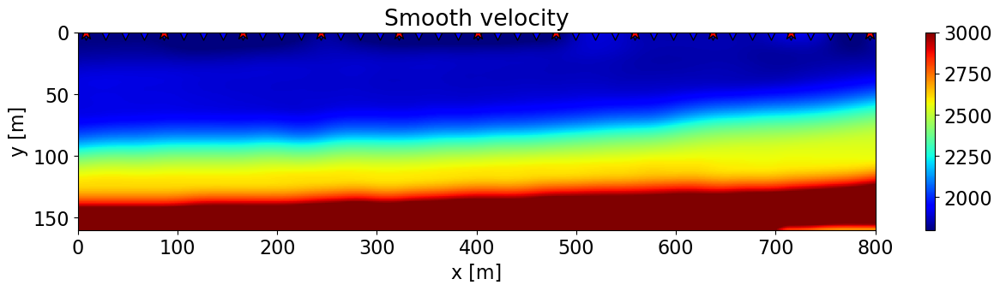

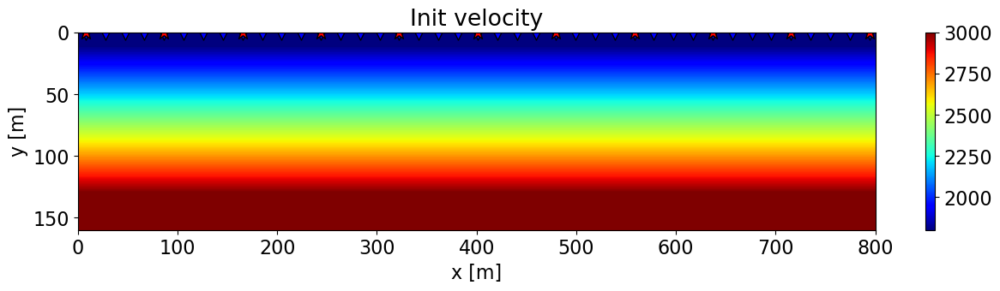

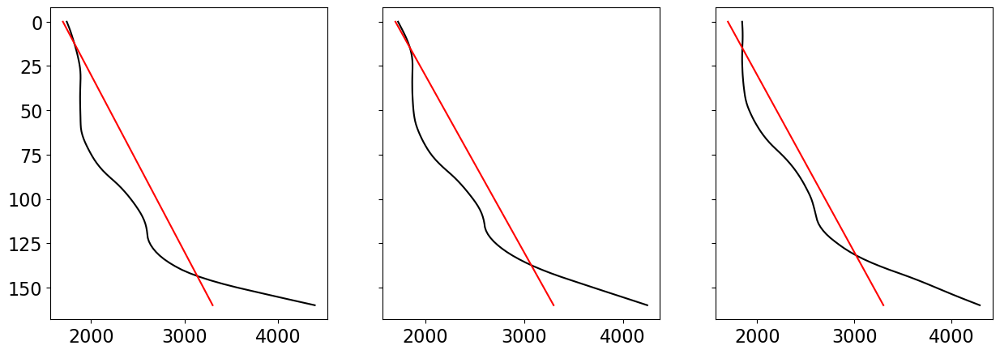

In [2]:
# Velocity model
nx, nz = 1360, 280
dx, dz = 2., 2.

vel_true = np.fromfile("../data/marmousi.bin", dtype='float32', sep="") 
vel_true = vel_true.reshape(nx, nz)[100:501, 100:181]#[500:901, 100:181]
nx, nz = vel_true.shape
x, z = np.arange(nx) * dx, np.arange(nz) * dz

# Smooth velocity
nsmooth = 15
vel_sm = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, vel_true, axis=0)
vel_sm = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, vel_sm, axis=1)

# Initial velocity
nsmooth = 15
vel_init = vel_sm.copy()
for _ in range(8):
    vel_init = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, vel_init, axis=1)

vel_init = np.tile(1700 + 10 * z, (nx, 1))

# Receivers
nr = 41
rx = np.linspace(dx*4, (nx-4)*dx, nr)
rz = 0*np.ones(nr)
recs = np.vstack((rx, rz))
dr = recs[0,1]-recs[0,0]

# Sources
ns = 11
sx = np.linspace(dx*4, (nx-4)*dx, ns)
sz = 0*np.ones(ns)
sources = np.vstack((sx, sz))
ds = sources[0,1]-sources[0,0]

plt.figure(figsize=(15, 3))
im = plt.imshow(vel_sm.T, cmap='jet', vmin=1800, vmax=3000, extent=(x[0], x[-1], z[-1], z[0]))
plt.scatter(recs[0], recs[1], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(sources[0], sources[1], marker='*', s=150, c='r', edgecolors='k')
plt.colorbar(im)
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]')
plt.title('Smooth velocity')
plt.ylim(z[-1], z[0])

plt.figure(figsize=(15, 3))
im = plt.imshow(vel_init.T, cmap='jet', vmin=1800, vmax=3000, extent=(x[0], x[-1], z[-1], z[0]))
plt.scatter(recs[0], recs[1], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(sources[0], sources[1], marker='*', s=150, c='r', edgecolors='k')
plt.colorbar(im)
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]')
plt.title('Init velocity')
plt.ylim(z[-1], z[0]);

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 5))
for ax, ix in zip(axs, [nx//4, nx//2, 3*nx//4]):
    ax.plot(vel_sm[ix], z, 'k')
    ax.plot(vel_init[ix], z, 'r')
axs[-1].invert_yaxis()

## Survey geometry

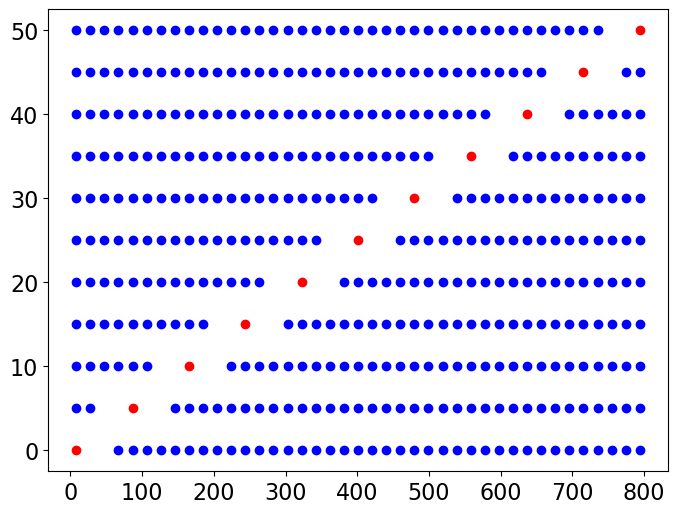

In [3]:
srcs = np.vstack((sx, sz))
recs = np.vstack((rx, rz))

survey = survey_geom(srcs, recs, minoffset=50)
display_survey(survey)

## Create data

In [4]:
lmax = 1e3
nl = 2000
thetas = np.hstack([np.arange(-85, -40, 0.05), np.arange(40, 85, 0.05)])

avasurvey = survey_raytrace(survey, vel_sm.T, x, z, lmax, nl, thetas, dzout=5., ray_rec_mindistance=5.)

## Invert

Iteration 1/15
RefrTomo-fun: Computing...
survey_raytrace: 400 Source-receiver pairs in survey, 276 Source-receiver paired with ray...
match_surveys: 305 Rays in survey1, 276 Rays in survey2, 189 Matched rays...
tomographic_matrix: 189 rows, 32481 columns
RefrTomo-fun: Misfit 0.0009
RefrTomo-fun: Elapsed time 26.803222179412842 s...
Iteration 2/15
RefrTomo-fun: Computing...
survey_raytrace: 400 Source-receiver pairs in survey, 302 Source-receiver paired with ray...
match_surveys: 305 Rays in survey1, 302 Rays in survey2, 218 Matched rays...
tomographic_matrix: 218 rows, 32481 columns
RefrTomo-fun: Misfit 0.0008
RefrTomo-fun: Elapsed time 43.68620491027832 s...
Iteration 3/15
RefrTomo-fun: Computing...
survey_raytrace: 400 Source-receiver pairs in survey, 329 Source-receiver paired with ray...
match_surveys: 305 Rays in survey1, 329 Rays in survey2, 246 Matched rays...
tomographic_matrix: 246 rows, 32481 columns
RefrTomo-fun: Misfit 0.0008
RefrTomo-fun: Elapsed time 44.055492877960205 s

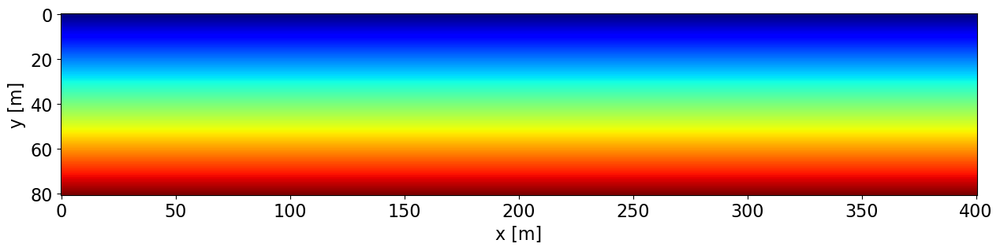

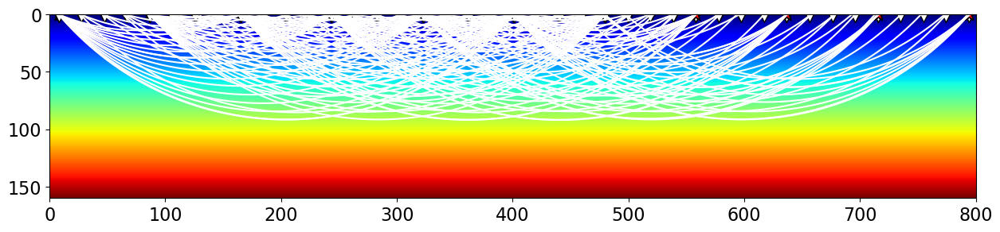

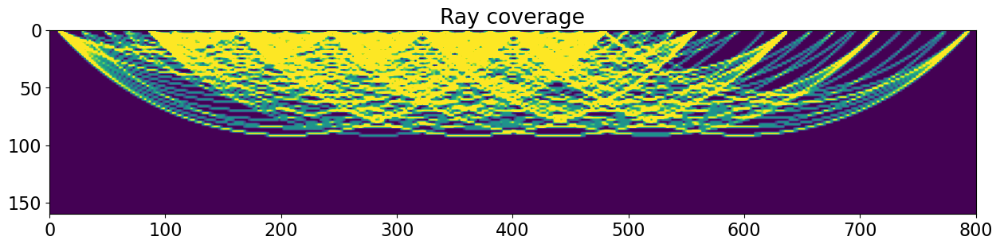

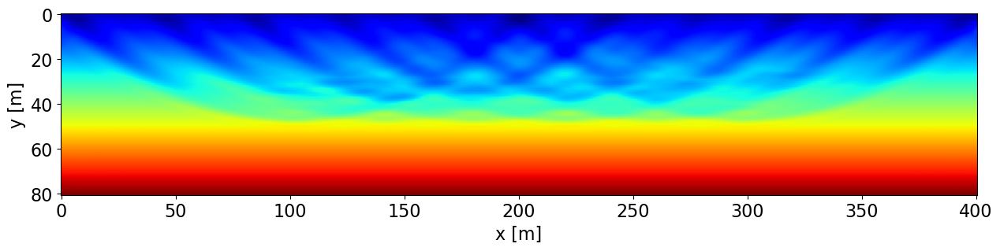

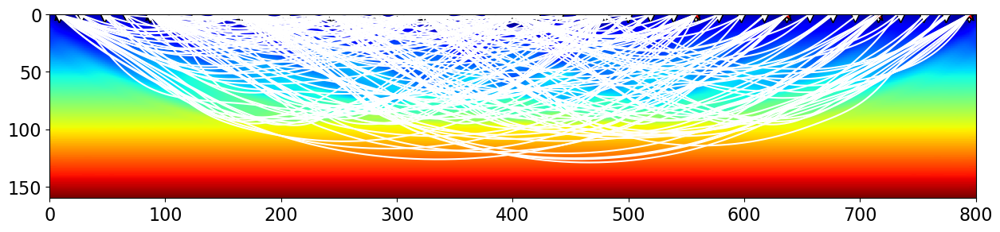

...

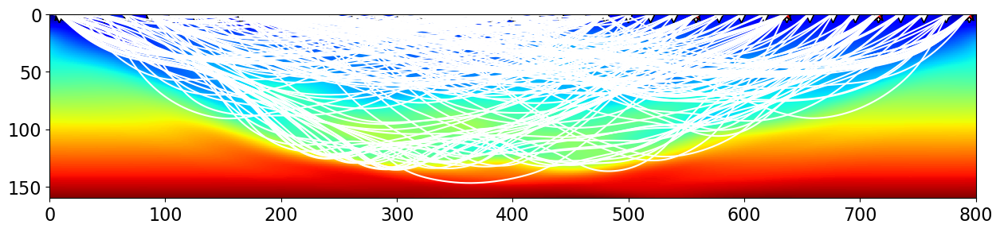

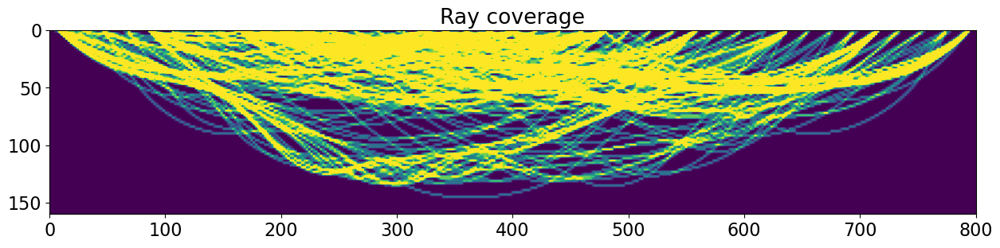

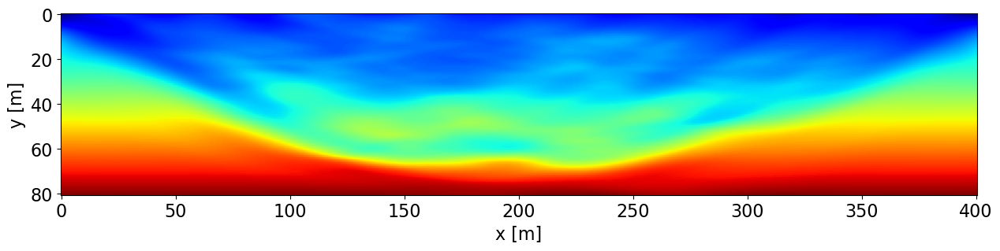

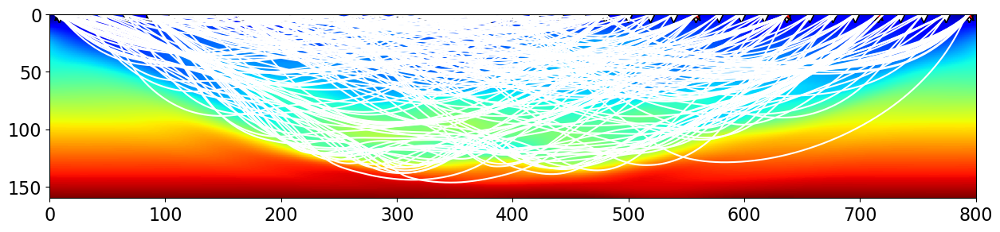

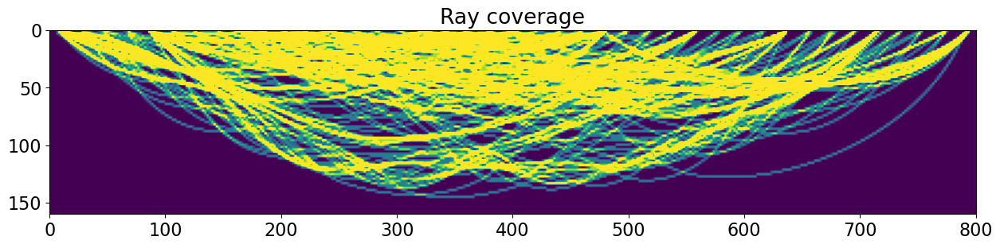

In [5]:
RTomo = RefrTomo(survey, avasurvey, x, z, lmax, nl, thetas, dzout=5., 
                 ray_rec_mindistance=5., epsL=8e1, weightsL=(10, 1), 
                 returnJ=True, debug=True)
vel_inv, misfit = RTomo.solve(vel_init, 15, lsqr_args=dict(iter_lim=40, damp=1e-1, show=False))

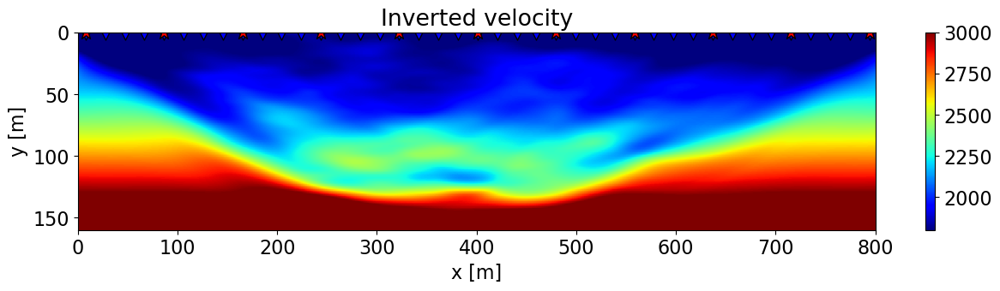

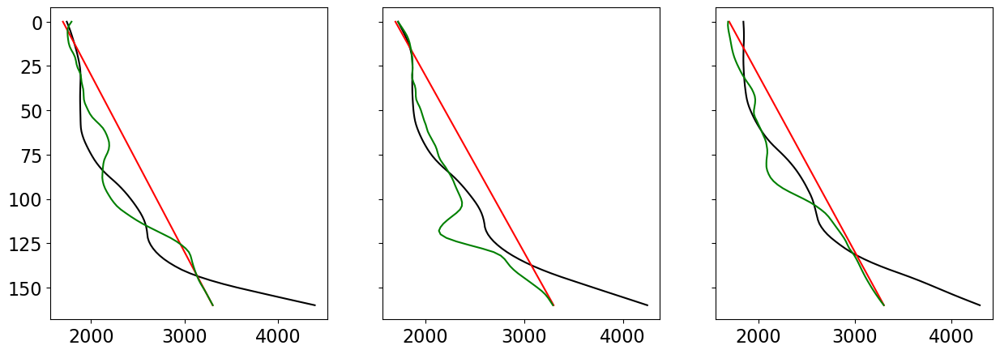

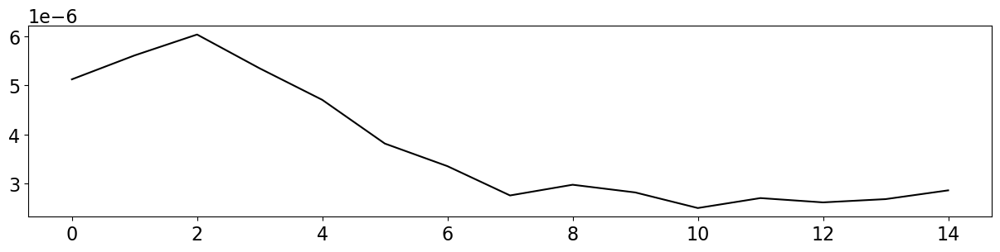

In [6]:
plt.figure(figsize=(15, 3))
im = plt.imshow(vel_inv.T, cmap='jet', vmin=1800, vmax=3000, extent=(x[0], x[-1], z[-1], z[0]))
plt.scatter(recs[0], recs[1], marker='v', s=150, c='b', edgecolors='k')
plt.scatter(sources[0], sources[1], marker='*', s=150, c='r', edgecolors='k')
plt.colorbar(im)
plt.axis('tight')
plt.xlabel('x [m]'),plt.ylabel('y [m]')
plt.title('Inverted velocity')
plt.ylim(z[-1], z[0])

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 5))
for ax, ix in zip(axs, [nx//4, nx//2, 3*nx//4]):
    ax.plot(vel_sm[ix], z, 'k')
    ax.plot(vel_init[ix], z, 'r')
    ax.plot(vel_inv[ix], z, 'g')
axs[-1].invert_yaxis()

plt.figure(figsize=(15, 3))
plt.plot(misfit, 'k');